# Paleogeographic analysis of ophiolite-bearing sutures

This Jupyter notebook contains code developed by N. Swanson-Hysell and Y. Park that conducts analysis and develops visualizations associated with the following Report published in Science in March 2019:

**Arc-continent collisions in the tropics set Earth’s climate state**

Macdonald, F.M.,  Swanson-Hysell, N.L., Park, Y., Lisiecki, L., and Jagoutz, O.

## Import necessary modules

This code is written in Python 2.7 using the following python modules that can be installed via pip or conda:
- pandas 0.24.1
- numpy 1.16.2
- matplotlib 2.2.3
- cartopy 0.17.0
- shapely 1.6.4

The full computational environment associated with these modules can be found within the suture_analysis.yml file in this repository. In addition, the code imports and uses custom python functions that are included within this repository as recon_tools.py. The implementation of this analysis relies heavily on functions within pygplates http://www.gplates.org/docs/pygplates/index.html. The pygplates code is compatible with Python 2, which is why this code is in Python 2 rather than 3.

In [1]:
import pygplates
import pandas as pd
import numpy as np
import random

import matplotlib.pyplot as plt
from matplotlib.legend import Legend
import matplotlib.patches as patches
import cartopy
import cartopy.crs as ccrs
from shapely.geometry.polygon import Polygon

from recon_tools import *

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

## Read In Files

The following code imports the following files:
- sutures_CEED_max : ophiolite-bearing sutures assigned CEED6 PlateIDs and with maximum age set by exhumation max and no minimum age
- sutures_CEED_max_min : ophiolite-bearing sutures assigned CEED6 PlateIDs and with maximum age and minimum age set by exhumation min and exhumation max
- sutures_M_max : ophiolite-bearing sutures assigned Matthews et al. (2016) PlateIDs and with maximum age set by exhumation max and no minimum age
- sutures_M_max_min : ophiolite-bearing sutures assigned Matthews et al. (2016) PlateIDs and with maximum age and minimum age set by exhumation min and exhumation max
- CEED_blocks : continental polygon blocks from the CEED6 model used in Torsvik and Cocks, (2017) with the addition of the Domeier (2018) Kazakh polygons
- Matthews_blocks : continental polygon blocks from the Matthews et al. (2016) model
- TC17_SHM17_D18_model : modified Torsvik and Cocks (2017) model that is modified by: 1) implementing the Swanson-Hysell and Macdonald (2017) Ordovician modification for Laurentia based on high-quality paleomagnetic data from allochthonous terranes and 2) adjustments of the early Paleozoic paleogeography of Asia made by Domeier (2018). These adjustments include the addition of ‘North Tianshan’ and ‘Boshekul-Chingiz’ zone rotation parameters so that sutures in the Kazakh terranes can be reconstructed as well as adjustments for North China, South China, Siberia and Tarim.
- M2016_model : rotation file for the Matthews et al. (2016) model (0 to 250 Ma)

The different suture files are generated by opening the Suture_Line.shp file in GPlates with different Suture_Lines.shp.gplates.xml files and then saving as .gpml files.

In [2]:
sutures_CEED_max = pygplates.FeatureCollection.read('data/sutures/CEED_Ex_max/Suture_Lines.gpml')
sutures_CEED_max_min = pygplates.FeatureCollection.read('data/sutures/CEED_Ex_max_min/Suture_Lines.gpml')
sutures_M_max = pygplates.FeatureCollection.read('data/sutures/CEED_Ex_max/Suture_Lines.gpml')
sutures_M_max_min = pygplates.FeatureCollection.read('data/sutures/CEED_Ex_max_min/Suture_Lines.gpml')

CEED_blocks = pygplates.FeatureCollection.read('paleogeo_models/CEED6+Kazakh/CEED6+D18_Kazakh.shp')
CEED_land = pygplates.FeatureCollection.read('paleogeo_models/CEED6/CEED6_LAND.shp')
Matthews_blocks = pygplates.FeatureCollection.read('paleogeo_models/Matthews_etal_2016_Global_Plate_Model_GPC/ContPolys/PresentDay_ContinentalPolygons_Matthews++.shp')

TC17_SHM17_D18_model = 'paleogeo_models/TC2017_SHM2017_D2018.rot'
M2016_model = 'paleogeo_models/Matthews_etal_2016_Global_Plate_Model_GPC/Global_EB_250-0Ma_GK07_Matthews++.rot'

There are additional attributes associated with the ophiolite-bearing suture shapefile that cannot be mapped into GPlates fields. To be able to deal with and interrogate these, we build up a pandas Dataframe and a dictionary from a .csv filed exported from QGIS. The attributes for a suture can be accessed using the suture name.

In [3]:
suture_attributes_df = pd.read_csv('data/sutures/Suture_Lines_attributes.csv',index_col='NAME')
suture_attributes = suture_attributes_df.to_dict('index')
suture_attributes['Kunlun']

{'EXMAX': 250,
 'EXMIN': 210,
 'ID': 42,
 'LENGTH_KM': 1714,
 'MAGMAX': 474,
 'MAGMIN': 244,
 'METMAX': 451,
 'METMIN': 384,
 'PLATEID_CE': 456,
 'PLATEID_M': 456,
 'REF': 'Schwab et al. (2004); Xiao et al. (2002)'}

## Plot compiled ophiolite-bearing sutures in present-day coordinates with CEED6 blocks

In [4]:
# input parameters
t = 0       #reconstruction time
anchor = 1  #anchor plate ID (1 : spin axis)

# reconstruct the continents to the present day 
# (which seems a bit silly, but exposes features associated with the reconstructed object)
CEED_blocks_present = []
pygplates.reconstruct(CEED_blocks, TC17_SHM17_D18_model, CEED_blocks_present, t, anchor)

CEED_land_present = []
pygplates.reconstruct(CEED_land, TC17_SHM17_D18_model, CEED_land_present, t, anchor)

# carry out the present-day reconstruction for the sutures
sutures_present = []
pygplates.reconstruct(sutures_CEED_max, TC17_SHM17_D18_model, sutures_present, t, anchor)

# carry out the present-day reconstruction for the sutures
sutures_present_active = []
pygplates.reconstruct(sutures_CEED_max_min, TC17_SHM17_D18_model, sutures_present_active, t, anchor)

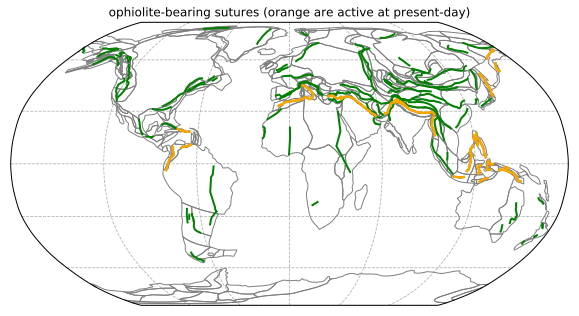

In [5]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
ax.set_global()
ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')

plot_reconstructed_feature(ax,CEED_blocks_present)
plot_reconstructed_feature(ax,sutures_present,color='green',linewidth=2)
plot_reconstructed_feature(ax,sutures_present_active,color='orange',linewidth=2.5)
plt.title('ophiolite-bearing sutures (orange are active at present-day)')
plt.show()

## Plot sutures color-coded by age

In [6]:
sutures_Cenozoic_collection = pygplates.FeatureCollection.read('data/sutures/Age_grouped/Suture_Lines_Cenozoic.shp')
sutures_Cenozoic = []
pygplates.reconstruct(sutures_Cenozoic_collection, TC17_SHM17_D18_model, sutures_Cenozoic, t, anchor)

sutures_Mesozoic_collection = pygplates.FeatureCollection.read('data/sutures/Age_grouped/Suture_Lines_Mesozoic.shp')
sutures_Mesozoic = []
pygplates.reconstruct(sutures_Mesozoic_collection, TC17_SHM17_D18_model, sutures_Mesozoic, t, anchor)

sutures_Paleozoic_late_collection = pygplates.FeatureCollection.read('data/sutures/Age_grouped/Suture_Lines_Paleozoic_late.shp')
sutures_Paleozoic_late = []
pygplates.reconstruct(sutures_Paleozoic_late_collection, TC17_SHM17_D18_model, sutures_Paleozoic_late, t, anchor)

sutures_Paleozoic_early_collection = pygplates.FeatureCollection.read('data/sutures/Age_grouped/Suture_Lines_Paleozoic_early.shp')
sutures_Paleozoic_early = []
pygplates.reconstruct(sutures_Paleozoic_early_collection, TC17_SHM17_D18_model, sutures_Paleozoic_early, t, anchor)

Here is a 20 palette Viridis color scheme.
Let's grab equally spaced colors for suture coloring.
- Cenozoic #440154
- Mesozoic #404788
- late Paleozoic #3CBB75FF
- early Paleozoic #FDE725FF

<color-palette name="Viridis 20" type="regular" >
<color>**#440154FF** </color>
<color>#481567FF </color>
<color>#482677FF </color>
<color>#453781FF </color>
<color>#404788FF </color>
<color>#39568CFF </color>
<color>**#33638DFF** </color>
<color>#2D708EFF </color>
<color>#287D8EFF </color>
<color>#238A8DFF </color>
<color>#1F968BFF </color>
<color>#20A387FF </color>
<color>#29AF7FFF </color>
<color>**#3CBB75FF** </color>
<color>#55C667FF </color>
<color>#73D055FF </color>
<color>#95D840FF </color>
<color>#B8DE29FF </color>
<color>#DCE319FF </color>
<color>**#FDE725FF** </color>
</color-palette>

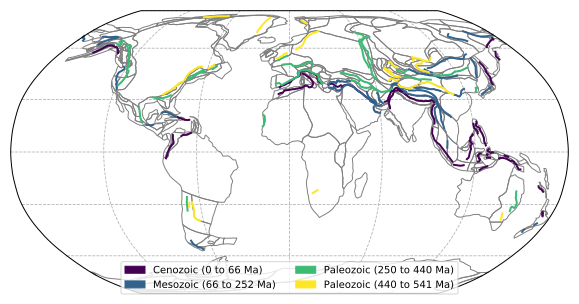

In [7]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
ax.set_global()
ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')

plot_reconstructed_feature(ax,CEED_blocks_present)
plot_reconstructed_feature(ax,sutures_Cenozoic,color='#440154',linewidth=2)
plot_reconstructed_feature(ax,sutures_Mesozoic,color='#33638D',linewidth=2)
plot_reconstructed_feature(ax,sutures_Paleozoic_late,color='#3CBB75',linewidth=2)
plot_reconstructed_feature(ax,sutures_Paleozoic_early,color='#FDE725',linewidth=2)

Cenozoic_patch = patches.Patch(color='#440154',linestyle='-', label='Cenozoic (0 to 66 Ma)')
Mesozoic_patch = patches.Patch(color='#33638D', label='Mesozoic (66 to 252 Ma)')
Paleozoic_late_patch = patches.Patch(color='#3CBB75', label='Paleozoic (250 to 440 Ma)')
Paleozoic_early_patch = patches.Patch(color='#FDE725', label='Paleozoic (440 to 541 Ma)')
plt.legend(ncol=2,bbox_to_anchor=(0.5, -.02),handles=[Cenozoic_patch,Mesozoic_patch,Paleozoic_late_patch,Paleozoic_early_patch],loc='lower center')

plt.show()

The calculated value below for the sum of the arc lengths is quite close to what one gets when calculating line lengths in QGIS for this shapefile.

In [8]:
suture_lengths_all = []
suture_lengths_active = []

for j in range(len(sutures_present)):
    arc_length = sutures_present[j].get_reconstructed_geometry().get_arc_length()
    arc_length_km = arc_length*pygplates.Earth.mean_radius_in_kms
    suture_lengths_all.append(arc_length_km)
    
for j in range(len(sutures_present_active)):
    arc_length = sutures_present_active[j].get_reconstructed_geometry().get_arc_length()
    arc_length_km = arc_length*pygplates.Earth.mean_radius_in_kms
    suture_lengths_active.append(arc_length_km)

print('total suture length calculate using pyGPlates')
print(np.sum(suture_lengths_all))
print('active suture length')
print(np.sum(suture_lengths_active))

total suture length calculate using pyGPlates
142336.2673359635
active suture length
28862.197092497434


In [9]:
print('total suture length calculated in QGIS')
print(suture_attributes_df.LENGTH_KM.sum())

total suture length calculated in QGIS
142371


## Length in latitude bins analysis

The function ```get_lengths_in_bands``` within recon_tools.py splits the polylines based on the latitude minimums and maximums provided. Let's do the split on the active sutures and plot the resulting lines to visualize this split.

In [10]:
# create the latitude bands
band_width = 10
lat_mins = np.arange(-90           , 90           , band_width)
lat_maxs = np.arange(-90+band_width, 90+band_width, band_width)
lat_mids = lat_mins + (lat_maxs-lat_mins)/2

# perform the calculations for sutures
active0_lengths, active0_polylines, active0_attributes = get_lengths_in_bands(sutures_present_active, lat_mins, lat_maxs)
np.sum(active0_lengths)

28967.44628192969

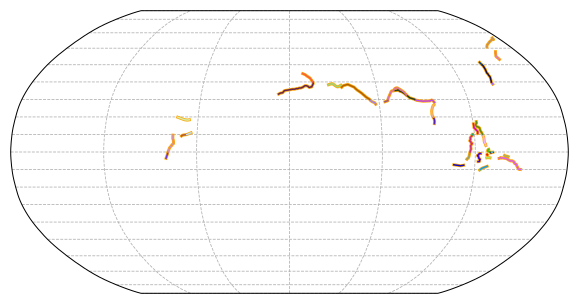

In [11]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
ax.set_global()
ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,10),linestyle='--')
plot_reconstructed_feature(ax,sutures_present_active,color='orange',linewidth=3)

for i in range(len(active0_polylines)):
    for j in range(len(active0_polylines[i])):

        random_color = np.random.rand(3)

        # pull out lat/lon vertices
        lat_lon_array = active0_polylines[i][j].to_lat_lon_array()
        lats = lat_lon_array[:,0]
        lons = lat_lon_array[:,1]

        ax.plot(lons,lats, transform=ccrs.Geodetic(), color=random_color, linewidth=1.5)
plt.show()

With the lengths split into latitude bands, the latitudinal distribution of modern active sutures can be plotted as a histogram.

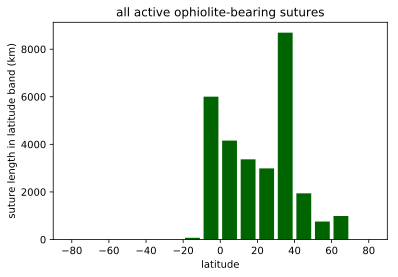

In [12]:
plt.bar(lat_mids,active0_lengths,width=8,align='center',color='darkgreen')
plt.xlim(-90,90)
plt.ylabel('suture length in latitude band (km)')
plt.xlabel('latitude')
plt.title('all active ophiolite-bearing sutures')
plt.show()

## Plot reconstructions at 0 Ma, 250 Ma, 300 Ma, and 445 Ma using the TC17_SHM17_D18_model

These times correspond to the peaks in the total suture length and are included in Figure 1 of the main text.

In [13]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
ax.set_global()
ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')

ax.add_patch(patches.Rectangle(xy=[-180, -15], width=360, height=30,
                                    facecolor='#52BE80',
                                    alpha=0.2,
                                    transform=ccrs.PlateCarree()))

plot_reconstructed_feature(ax,CEED_land_present,color='#D7DBDD',linewidth=0.5)
plot_reconstructed_feature(ax,CEED_blocks_present,color='#909497')
plot_reconstructed_feature(ax,sutures_Cenozoic,color='#440154',linewidth=2)
plot_reconstructed_feature(ax,sutures_Mesozoic,color='#33638D',linewidth=2)
plot_reconstructed_feature(ax,sutures_Paleozoic_late,color='#3CBB75',linewidth=2)
plot_reconstructed_feature(ax,sutures_Paleozoic_early,color='#FDE725',linewidth=2)

Cenozoic_patch = patches.Patch(color='#440154',linestyle='-', label='Cenozoic (0 to 66 Ma)')
Mesozoic_patch = patches.Patch(color='#33638D', label='Mesozoic (66 to 252 Ma)')
Paleozoic_late_patch = patches.Patch(color='#3CBB75', label='Paleozoic (250 to 440 Ma)')
Paleozoic_early_patch = patches.Patch(color='#FDE725', label='Paleozoic (440 to 541 Ma)')
plt.legend(ncol=2,bbox_to_anchor=(0.5, -.02),handles=[Cenozoic_patch,Mesozoic_patch,Paleozoic_late_patch,Paleozoic_early_patch],loc='lower center')

plt.savefig('code_output/0Ma_reconstruction.svg')
plt.show()

In [14]:
t = 250     #reconstruction time
anchor = 1  #anchor plate ID (1 : spin axis)

CEED_blocks_250 = []
pygplates.reconstruct(CEED_blocks, TC17_SHM17_D18_model, CEED_blocks_250, t, anchor)

CEED_land_250 = []
pygplates.reconstruct(CEED_land, TC17_SHM17_D18_model, CEED_land_250, t, anchor)

sutures_active_250 = []
pygplates.reconstruct(sutures_CEED_max_min, TC17_SHM17_D18_model, sutures_active_250, t, anchor)

fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
ax.set_global()
ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')
ax.add_patch(patches.Rectangle(xy=[-180, -15], width=360, height=30,
                                    facecolor='#52BE80',
                                    alpha=0.2,
                                    transform=ccrs.PlateCarree()))

plot_reconstructed_feature(ax,CEED_land_250,color='#D7DBDD',linewidth=0.5)
plot_reconstructed_feature(ax,CEED_blocks_250,color='#909497')
plot_reconstructed_feature(ax,sutures_active_250,color='orange',linewidth=2.5)
active_patch = patches.Patch(color='orange',linestyle='-', label='active sutures')
plt.legend(ncol=2,bbox_to_anchor=(0.5, -.02),handles=[active_patch],loc='lower center')
plt.savefig('code_output/250Ma_reconstruction.svg')
plt.show()

In [15]:
t = 300     #reconstruction time
anchor = 1  #anchor plate ID (1 : spin axis)

CEED_blocks_300 = []
pygplates.reconstruct(CEED_blocks, TC17_SHM17_D18_model, CEED_blocks_300, t, anchor)

CEED_land_300 = []
pygplates.reconstruct(CEED_land, TC17_SHM17_D18_model, CEED_land_300, t, anchor)

sutures_active_300 = []
pygplates.reconstruct(sutures_CEED_max_min, TC17_SHM17_D18_model, sutures_active_300, t, anchor)

fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
ax.set_global()
ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')
ax.add_patch(patches.Rectangle(xy=[-180, -15], width=360, height=30,
                                    facecolor='#52BE80',
                                    alpha=0.2,
                                    transform=ccrs.PlateCarree()))

plot_reconstructed_feature(ax,CEED_land_300,color='#D7DBDD',linewidth=0.5)
plot_reconstructed_feature(ax,CEED_blocks_300,color='#909497')
plot_reconstructed_feature(ax,sutures_active_300,color='orange',linewidth=2.5)
active_patch = patches.Patch(color='orange',linestyle='-', label='active sutures')
plt.legend(ncol=2,bbox_to_anchor=(0.5, -.02),handles=[active_patch],loc='lower center')
plt.savefig('code_output/300Ma_reconstruction.svg')
plt.show()

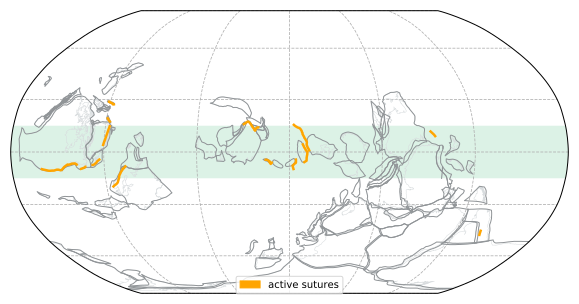

In [16]:
t = 445     #reconstruction time
anchor = 1  #anchor plate ID (1 : spin axis)

CEED_blocks_445 = []
pygplates.reconstruct(CEED_blocks, TC17_SHM17_D18_model, CEED_blocks_445, t, anchor)

CEED_land_445 = []
pygplates.reconstruct(CEED_land, TC17_SHM17_D18_model, CEED_land_445, t, anchor)

sutures_active_445 = []
pygplates.reconstruct(sutures_CEED_max_min, TC17_SHM17_D18_model, sutures_active_445, t, anchor)

fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
ax.set_global()
ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')
ax.add_patch(patches.Rectangle(xy=[-180, -15], width=360, height=30,
                                    facecolor='#52BE80',
                                    alpha=0.2,
                                    transform=ccrs.PlateCarree()))

plot_reconstructed_feature(ax,CEED_land_445,color='#D7DBDD',linewidth=0.5)
plot_reconstructed_feature(ax,CEED_blocks_445,color='#909497')
plot_reconstructed_feature(ax,sutures_active_445,color='orange',linewidth=2.5)
active_patch = patches.Patch(color='orange',linestyle='-', label='active sutures')
plt.legend(ncol=2,bbox_to_anchor=(0.5, -.02),handles=[active_patch],loc='lower center')
plt.savefig('code_output/445Ma_reconstruction.svg')
plt.show()

## Reconstruct ophiolite-bearing sutures through time and their latitudinal distribution (5º increments for analysis)

These reconstructions are done using the revised Torsvik and Cocks (2017) model (with Swanson-Hysell and Macdonald (2017) and Domeier (2018) adjustments) and the Matthews et al. (2016) model.

In [17]:
time_list_5Myr = range(0,525,5)
anchor = 1

band_width = 10
lat_mins = np.arange(-90           , 90           , band_width)
lat_maxs = np.arange(-90+band_width, 90+band_width, band_width)
lat_mids = lat_mins + (lat_maxs-lat_mins)/2
    
active_lengths_array_TC17_SHM17_D18_10degree = []

for t in time_list_5Myr:
    sutures_active_recon = []
    pygplates.reconstruct(sutures_CEED_max_min, TC17_SHM17_D18_model, sutures_active_recon, t, anchor)
    
    active_lengths, active_polylines, active_attributes = get_lengths_in_bands(sutures_active_recon, lat_mins, lat_maxs)
    active_lengths_array_TC17_SHM17_D18_10degree.append(active_lengths)

In [18]:
band_width_5degree = 5
lat_mins_5degree = np.arange(-90           , 90           , band_width_5degree)
lat_maxs_5degree = np.arange(-90+band_width_5degree, 90+band_width_5degree, band_width_5degree)
lat_mids_5degree = lat_mins_5degree + (lat_maxs_5degree-lat_mins_5degree)/2.0
    
active_lengths_array_TC17_SHM17_D18_5degree = []
total_active_length_TC17_SHM17_D18 = []

for t in time_list_5Myr:
    sutures_active_recon = []
    pygplates.reconstruct(sutures_CEED_max_min, TC17_SHM17_D18_model, sutures_active_recon, t, anchor)
    
    active_lengths, active_polylines, active_attributes = get_lengths_in_bands(sutures_active_recon, lat_mins_5degree, lat_maxs_5degree)
    active_lengths_array_TC17_SHM17_D18_5degree.append(active_lengths)
    total_active_length_TC17_SHM17_D18.append(np.sum(active_lengths))
    
time_list_250Ma_5Myr = range(0,255,5)
active_lengths_array_M2016_5degree = [] 
total_active_length_M2016 = []

for t in time_list_250Ma_5Myr:
    sutures_active_recon = []
    pygplates.reconstruct(sutures_CEED_max_min, M2016_model, sutures_active_recon, t, anchor)
    
    active_lengths, active_polylines, active_attributes = get_lengths_in_bands(sutures_active_recon, lat_mins_5degree, lat_maxs_5degree)
    active_lengths_array_M2016_5degree.append(active_lengths)
    total_active_length_M2016.append(np.sum(active_lengths))

In [19]:
length_neg5_5_list_TC17_SHM17_D18 = []

for t in range(0,len(time_list_5Myr)):
    length_0_5 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2]
    length_neg5_0 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-1]
    length_neg5_5 = length_neg5_0 + length_0_5
    length_neg5_5_list_TC17_SHM17_D18.append(length_neg5_5)
    
length_neg10_10_list_TC17_SHM17_D18 = []

for t in range(0,len(time_list_5Myr)):
    length_0_5 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2]
    length_5_10 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2+1]
    length_neg5_0 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-1]
    length_neg10_neg5 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-2]
    length_neg10_10 = length_neg10_neg5 + length_neg5_0 + length_0_5 + length_5_10
    length_neg10_10_list_TC17_SHM17_D18.append(length_neg10_10) 
    
length_neg15_15_list_TC17_SHM17_D18 = []

for t in range(0,len(time_list_5Myr)):
    length_0_5 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2]
    length_5_10 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2+1]
    length_10_15 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2+2]
    length_neg5_0 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-1]
    length_neg10_neg5 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-2]
    length_neg15_neg10 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-3]
    length_neg15_15 = length_neg15_neg10 + length_neg10_neg5 + length_neg5_0 + length_0_5 + length_5_10 + length_10_15
    length_neg15_15_list_TC17_SHM17_D18.append(length_neg15_15) 
    
length_neg20_20_list_TC17_SHM17_D18 = []

for t in range(0,len(time_list_5Myr)):
    length_0_5 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2]
    length_5_10 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2+1]
    length_10_15 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2+2]
    length_15_20 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2+3]    
    length_neg5_0 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-1]
    length_neg10_neg5 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-2]
    length_neg15_neg10 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-3]
    length_neg20_neg15 = active_lengths_array_TC17_SHM17_D18_5degree[t][len(lat_mids_5degree)/2-4]   
    length_neg20_20 = length_neg20_neg15 + length_neg15_neg10 + length_neg10_neg5 + length_neg5_0 + length_0_5 + length_5_10 + length_10_15 + length_15_20 
    length_neg20_20_list_TC17_SHM17_D18.append(length_neg20_20) 

In [20]:
length_neg5_5_list_M2016 = []

for t in range(0,len(time_list_250Ma_5Myr)):
    length_0_5 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2]
    length_neg5_0 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-1]
    length_neg5_5 = length_neg5_0 + length_0_5
    length_neg5_5_list_M2016.append(length_neg5_5)
    
length_neg10_10_list_M2016 = []

for t in range(0,len(time_list_250Ma_5Myr)):
    length_0_5 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2]
    length_5_10 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2+1]
    length_neg5_0 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-1]
    length_neg10_neg5 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-2]
    length_neg10_10 = length_neg10_neg5 + length_neg5_0 + length_0_5 + length_5_10
    length_neg10_10_list_M2016.append(length_neg10_10) 
    
length_neg15_15_list_M2016 = []

for t in range(0,len(time_list_250Ma_5Myr)):
    length_0_5 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2]
    length_5_10 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2+1]
    length_10_15 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2+2]
    length_neg5_0 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-1]
    length_neg10_neg5 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-2]
    length_neg15_neg10 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-3]
    length_neg15_15 = length_neg15_neg10 + length_neg10_neg5 + length_neg5_0 + length_0_5 + length_5_10 + length_10_15
    length_neg15_15_list_M2016.append(length_neg15_15) 
    
length_neg20_20_list_M2016 = []

for t in range(0,len(time_list_250Ma_5Myr)):
    length_0_5 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2]
    length_5_10 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2+1]
    length_10_15 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2+2]
    length_15_20 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2+3]    
    length_neg5_0 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-1]
    length_neg10_neg5 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-2]
    length_neg15_neg10 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-3]
    length_neg20_neg15 = active_lengths_array_M2016_5degree[t][len(lat_mids_5degree)/2-4]   
    length_neg20_20 = length_neg20_neg15 + length_neg15_neg10 + length_neg10_neg5 + length_neg5_0 + length_0_5 + length_5_10 + length_10_15 + length_15_20 
    length_neg20_20_list_M2016.append(length_neg20_20) 

In [21]:
length_greater40_list_TC17_SHM17_D18 = []

for t in range(0,len(time_list_5Myr)):
    length_neg90_neg40 = active_lengths_array_TC17_SHM17_D18_5degree[t][0:10].sum()
    length_40_90 = active_lengths_array_TC17_SHM17_D18_5degree[t][-10:].sum()
    length_greater40_list_TC17_SHM17_D18.append(length_neg90_neg40 + length_40_90)

### Plot total suture length

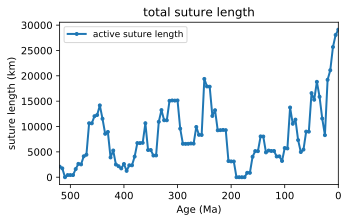

In [22]:
plt.figure(figsize=(5,3))
plt.plot(time_list_5Myr,total_active_length_TC17_SHM17_D18,'.-',linewidth=2,label='active suture length')
plt.xlim(520, 0)
plt.xlabel('Age (Ma)')
plt.ylabel('suture length (km)')
plt.title('total suture length')
plt.legend(fontsize=9,loc=2)
plt.show()

### Tropical suture length (TC17_SHM17_D18 and M2016)

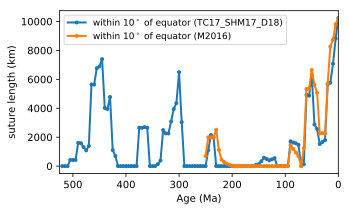

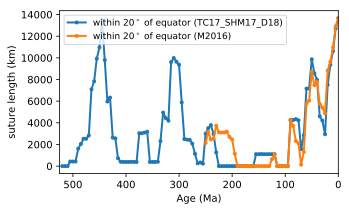

In [23]:
plt.figure(figsize=(5,3))
plt.plot(time_list_5Myr,length_neg10_10_list_TC17_SHM17_D18,'.-',
         linewidth=2,label='within 10$^\circ$ of equator (TC17_SHM17_D18)')
plt.plot(time_list_250Ma_5Myr,length_neg10_10_list_M2016,'.-',
         linewidth=2,label='within 10$^\circ$ of equator (M2016)')
plt.xlim(525, 0)
plt.xlabel('Age (Ma)')
plt.ylabel('suture length (km)')
plt.legend(fontsize=9,loc=2)
plt.show()

plt.figure(figsize=(5,3))
plt.plot(time_list_5Myr,length_neg20_20_list_TC17_SHM17_D18,'.-',
         linewidth=2,label='within 20$^\circ$ of equator (TC17_SHM17_D18)')
plt.plot(time_list_250Ma_5Myr,length_neg20_20_list_M2016,'.-',
         linewidth=2,label='within 20$^\circ$ of equator (M2016)')
plt.xlim(525, 0)
plt.xlabel('Age (Ma)')
plt.ylabel('suture length (km)')
plt.legend(fontsize=9,loc=2)
plt.show()

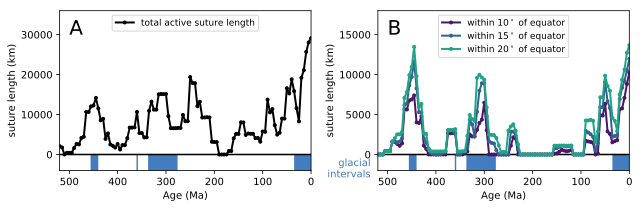

In [24]:
plt.figure(figsize=(9,3))
ax1 = plt.subplot(1,2,1)
ax1.plot(time_list_5Myr,total_active_length_TC17_SHM17_D18,'.-',linewidth=2,label='total active suture length',color='k')
plt.xlim(520, 0)
plt.ylim(-4000,36000)

#Hirnantian glaciation (456 to 440 Ma)
Hirnantian = patches.Rectangle((440,-4000),16,4000,edgecolor='none',facecolor='#447CC0')
ax1.add_patch(Hirnantian)
#Devonian glaciation (361-358 Ma)
Devonian = patches.Rectangle((358,-4000),3,4000,edgecolor='none',facecolor='#447CC0')
ax1.add_patch(Devonian)
#Late Paleozoic ice age (337 to 276 Ma)
LPIA = patches.Rectangle((276,-4000),61,4000,edgecolor='none',facecolor='#447CC0')
ax1.add_patch(LPIA)
#Cenozoic glaciation (35 to 0 Ma)
Cenozoic = patches.Rectangle((0,-4000),35,4000,edgecolor='none',facecolor='#447CC0')
ax1.add_patch(Cenozoic)

ax1.hlines(0,0,525)
#ax1.text(535,-1000,'glacial\nintervals',verticalalignment='top',horizontalalignment='right',color='#447CC0')
plt.xlabel('Age (Ma)')
plt.ylabel('suture length (km)')
plt.legend(fontsize=9,loc='upper center')
plt.text(500,30000,'A', color='k',ha ='left',size=20)

ax2 = plt.subplot(1,2,2)
ax2.plot(time_list_5Myr,length_neg10_10_list_TC17_SHM17_D18,'.-',linewidth=2,label='within 10$^\circ$ of equator',color='#481567')
ax2.plot(time_list_5Myr,length_neg15_15_list_TC17_SHM17_D18,'.-',linewidth=2,label='within 15$^\circ$ of equator',color='#33638D')
ax2.plot(time_list_5Myr,length_neg20_20_list_TC17_SHM17_D18,'.-',linewidth=2,label='within 20$^\circ$ of equator',color='#20A387')
plt.xlim(520, 0)
plt.ylim(-2000,18000)

#Hirnantian glaciation (456 to 440 Ma)
Hirnantian = patches.Rectangle((440,-4000),16,4000,edgecolor='none',facecolor='#447CC0')
ax2.add_patch(Hirnantian)
#Devonian glaciation (361-358 Ma)
Devonian = patches.Rectangle((358,-4000),3,4000,edgecolor='none',facecolor='#447CC0')
ax2.add_patch(Devonian)
#Late Paleozoic ice age (337 to 276 Ma)
LPIA = patches.Rectangle((276,-4000),61,4000,edgecolor='none',facecolor='#447CC0')
ax2.add_patch(LPIA)
#Cenozoic glaciation (35 to 0 Ma)
Cenozoic = patches.Rectangle((0,-4000),35,4000,edgecolor='none',facecolor='#447CC0')
ax2.add_patch(Cenozoic)
ax2.hlines(0,0,525)
ax2.text(535,-500,'glacial\nintervals',verticalalignment='top',horizontalalignment='right',color='#447CC0')
plt.xlabel('Age (Ma)')
plt.ylabel('suture length (km)')
plt.legend(fontsize=9,loc='upper center')
plt.text(500,15000,'B', color='k',ha ='left',size=20)

plt.tight_layout()
plt.show()

## Import ice extent compilation

In [25]:
ice_extent = pd.read_csv('data/ice/IceExtent_Myr.csv')
ice_extent.head()

,AGE (MA),LATITUDE FROM POLE,GLACIATED REGION,REFERENCE
0,0,50,USA Midwest,Ehlers & Gibbard (2007)
1,1,50,USA Midwest,Ehlers & Gibbard (2007)
2,2,40,Canada,Ehlers & Gibbard (2007)
3,3,30,Greenland,Ehlers & Gibbard (2007)
4,4,30,Greenland,Ehlers & Gibbard (2007)


In [26]:
ice_extent_5Myr = []
ice_extent_5Myr_flip = []

for t in time_list_5Myr:
    ice_extent_5Myr.append(ice_extent['LATITUDE FROM POLE'][t])
    ice_extent_5Myr_flip.append(90-ice_extent['LATITUDE FROM POLE'][t])

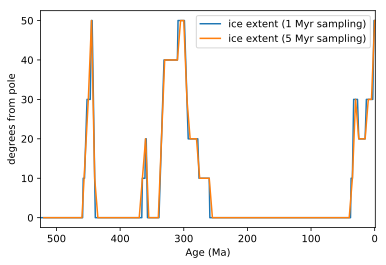

In [27]:
plt.plot(ice_extent['AGE (MA)'],ice_extent['LATITUDE FROM POLE'],label='ice extent (1 Myr sampling)')
plt.plot(time_list_5Myr,ice_extent_5Myr,label='ice extent (5 Myr sampling)') 
plt.xlim(525,-1)
plt.legend()
plt.xlabel('Age (Ma)')
plt.ylabel('degrees from pole')
plt.show()

## Generate figure with suture length and ice extent

### Version used as Figure 2 of the main text

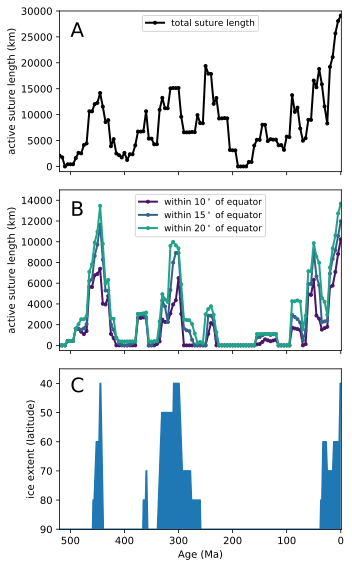

In [28]:
plt.figure(figsize=(5,8))
ax1 = plt.subplot(3,1,1)
ax1.plot(time_list_5Myr,total_active_length_TC17_SHM17_D18,'.-',linewidth=2,label='total suture length',color='k')
plt.xlim(520, -1)
plt.ylim(-1000,30000)

#plt.xlabel('Age (Ma)')
plt.ylabel('active suture length (km)')
plt.legend(fontsize=9,loc='upper center')
plt.text(500,25000,'A', color='k',ha ='left',size=20)
ax1.set_xticklabels([])

ax2 = plt.subplot(3,1,2)
ax2.plot(time_list_5Myr,length_neg10_10_list_TC17_SHM17_D18,'.-',linewidth=2,label='within 10$^\circ$ of equator',color='#481567')
ax2.plot(time_list_5Myr,length_neg15_15_list_TC17_SHM17_D18,'.-',linewidth=2,label='within 15$^\circ$ of equator',color='#33638D')
ax2.plot(time_list_5Myr,length_neg20_20_list_TC17_SHM17_D18,'.-',linewidth=2,label='within 20$^\circ$ of equator',color='#20A387')
plt.xlim(520, -1)
plt.ylim(-500,15000)

plt.ylabel('active suture length (km)')
plt.legend(fontsize=9,loc='upper center')
plt.text(500,12500,'B', color='k',ha ='left',size=20)
ax2.set_xticklabels([])

ax3 = plt.subplot(3,1,3)
#ax3.plot(time_list_5Myr,ice_extent_5Myr_flip)
#ax3.fill_between(time_list_5Myr,ice_extent_5Myr_flip,90)
ax3.plot(ice_extent['AGE (MA)'],90-ice_extent['LATITUDE FROM POLE'])
ax3.fill_between(ice_extent['AGE (MA)'],90-ice_extent['LATITUDE FROM POLE'],90)
plt.xlim(520, -1)
plt.ylim(90.1, 35)
plt.text(500,43,'C', color='k',ha ='left',size=20)
plt.ylabel('ice extent (latitude)')
plt.xlabel('Age (Ma)')

plt.tight_layout()
plt.savefig('code_output/suture_length.pdf')
plt.show()

## Import LIP data

The tropical LIP area data file that is imported here was generated through the analysis conducted in the LIP_analysis.ipynb notebook within this repository.

In [29]:
LIP_data = pd.read_csv('code_output/tropical_LIP_areas.csv')
LIP_data.sort_values('age (Ma)',inplace=True)
LIP_data.reset_index(drop=True,inplace=True)
LIP_data.head()

,age (Ma),natural decay total,natural decay within 15,natural decay outside 15,burial total,burial within 15,burial outside 15
0,0,1.546719e+07,4.018145e+06,1.144905e+07,8.292567e+06,6.951587e+05,7.597408e+06
1,5,1.600936e+07,4.274703e+06,1.173466e+07,8.576135e+06,7.591877e+05,7.816947e+06
2,10,1.628666e+07,4.334840e+06,1.195182e+07,8.868690e+06,8.711188e+05,7.997571e+06
3,15,1.701534e+07,4.877040e+06,1.213830e+07,9.067315e+06,9.933969e+05,8.073918e+06
4,20,1.654807e+07,4.927924e+06,1.162014e+07,8.720372e+06,1.129023e+06,7.591349e+06


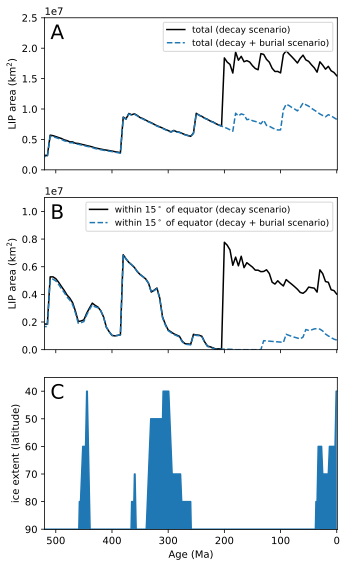

In [30]:
plt.figure(figsize=(5,8))
ax1 = plt.subplot(3,1,1)

ax1.plot(LIP_data['age (Ma)'],LIP_data['natural decay total'],label='total (decay scenario)',color='black')
ax1.plot(LIP_data['age (Ma)'],LIP_data['burial total'],label='total (decay + burial scenario)',linestyle='dashed')
plt.ylabel('LIP area (km$^2$)')
plt.legend(fontsize=9,loc='upper right')
plt.text(0.02,0.86,'A', color='k',ha ='left',size=20,transform=ax1.transAxes)
ax1.set_xticklabels([])
plt.xlim(520, -1)
plt.ylim(0, 2.5E7)

ax2 = plt.subplot(3,1,2)
ax2.plot(LIP_data['age (Ma)'],LIP_data['natural decay within 15'],label='within 15$^\circ$ of equator (decay scenario)',color='black')
ax2.plot(LIP_data['age (Ma)'],LIP_data['burial within 15'],linestyle='dashed',label='within 15$^\circ$ of equator (decay + burial scenario)')

plt.xlim(520, -1)
plt.ylim(0, 1.1E7)
plt.ylabel('LIP area (km$^2$)')
plt.legend(fontsize=9,loc='upper right')
plt.text(0.02,0.86,'B', color='k',ha ='left',size=20,transform=ax2.transAxes)
ax2.set_xticklabels([])

ax3 = plt.subplot(3,1,3)
#ax3.plot(time_list_5Myr,ice_extent_5Myr_flip)
#ax3.fill_between(time_list_5Myr,ice_extent_5Myr_flip,90)
ax3.plot(ice_extent['AGE (MA)'],90-ice_extent['LATITUDE FROM POLE'])
ax3.fill_between(ice_extent['AGE (MA)'],90-ice_extent['LATITUDE FROM POLE'],90)
plt.xlim(520, -1)
plt.ylim(90.1, 35)
plt.text(0.02,0.86,'C', color='k',ha ='left',size=20,transform=ax3.transAxes)
plt.ylabel('ice extent (latitude)')
plt.xlabel('Age (Ma)')

plt.tight_layout()
plt.savefig('code_output/LIP_area.pdf')
plt.show()

## Import continental arc length compilation of Cao et al. (2017)

In [31]:
continental_arc_length = pd.read_csv('data/continental_arcs/Cao2017_arclength.csv')
continental_arc_length.head()
continental_arc_length_5Myr = []
for t in time_list_5Myr:
    continental_arc_length_5Myr.append(continental_arc_length['average length (km)'][t])

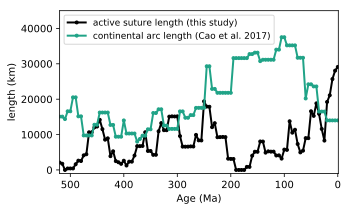

In [32]:
plt.figure(figsize=(5,3))
ax1 = plt.subplot(1,1,1)
ax1.plot(time_list_5Myr,total_active_length_TC17_SHM17_D18,'.-',linewidth=2,label='active suture length (this study)',color='k')
ax1.plot(time_list_5Myr,continental_arc_length_5Myr,'.-',linewidth=2,label='continental arc length (Cao et al. 2017)',color='#20A387')
plt.xlim(520, -1)
plt.ylim(-1000,45000)
plt.legend(fontsize=9,loc='upper left')
plt.ylabel('length (km)')
plt.xlabel('Age (Ma)')
plt.show()

## Develop and export master dataframe of results

The dataframe has the following columns:
- age_Ma : list of ages in 5 million year increments
- ice_extent : ice extent compilation in maximum degrees from a pole at each age
- total_suture : is the total active suture length at each age
- within_10_suture : is the total active suture length at any given time within 10 degrees of the equator (using TC17_SHM17_D18 paleogeographic model)
- greater_10_suture : is the total active suture length at any given time outside of 10 degrees from the equator
- within_15_suture : is the total active suture length at any given time within 15 degrees of the equator
- greater_15_suture : is the total active suture length at any given time outside of 15 degrees from the equator
- within_20_suture : is the total active suture length at any given time within 20 degrees of the equator
- greater_20_suture : is the total active suture length at any given time outside of 20 degrees from the equator
- greater_40_suture : is the total active suture length at any given time outside of 40 degrees from the equator
- total_LIP_decay : is the total LIP area using the decay scenario which implements a half-life decay for LIPs
- total_LIP_decay_burial : is the total LIP area using the decay and burial scenario which implements a half-life decay for LIPs and burial for LIPs in a rift setting
- within_15_LIP_decay : is the LIP area within 15 degrees of the equator using the decay scenario
- within_15_LIP_decay_burial : is the LIP area within 15 degrees of the equator using the decay and burial scenario
- outside_15_LIP_decay : is the LIP area outside 15 degrees of the equator using the decay scenario
- outside_15_LIP_decay_burial : is the LIP area outside 15 degrees of the equator using the decay and burial scenario
- continental_arc_Cao2017 : is the active continental arc length from the compilation of Cao et al. 2017

In [44]:
output_df = pd.DataFrame(columns=['age_Ma'])

output_df['age_Ma'] = time_list_5Myr
output_df['ice_extent'] = ice_extent_5Myr

output_df['total_suture'] = total_active_length_TC17_SHM17_D18
output_df['within_10_suture'] = length_neg10_10_list_TC17_SHM17_D18
output_df['within_15_suture'] = length_neg15_15_list_TC17_SHM17_D18
output_df['within_20_suture'] = length_neg20_20_list_TC17_SHM17_D18
output_df['greater_10_suture'] = output_df['total_suture'] - output_df['within_10_suture']
output_df['greater_15_suture'] = output_df['total_suture'] - output_df['within_15_suture']
output_df['greater_20_suture'] = output_df['total_suture'] - output_df['within_20_suture']
output_df['greater_40_suture'] = length_greater40_list_TC17_SHM17_D18

output_df['total_LIP_decay'] = LIP_data['natural decay total']
output_df['total_LIP_decay_burial'] = LIP_data['burial total']
output_df['within_15_LIP_decay'] = LIP_data['natural decay within 15']
output_df['within_15_LIP_decay_burial'] = LIP_data['burial within 15']
output_df['outside_15_LIP_decay'] = LIP_data['natural decay outside 15']
output_df['outside_15_LIP_decay_burial'] = LIP_data['burial outside 15']

output_df['continental_arc_Cao2017'] = continental_arc_length_5Myr

output_df.to_csv('code_output/ice_LIP_suture_lengths.csv',index=False)
output_df.to_csv('code_output/ice_LIP_suture_lengths.txt',index=False,sep=' ')

output_df.head()

,age_Ma,ice_extent,total_suture,within_10_suture,within_15_suture,within_20_suture,greater_10_suture,greater_15_suture,greater_20_suture,greater_40_suture,total_LIP_decay,total_LIP_decay_burial,within_15_LIP_decay,within_15_LIP_decay_burial,outside_15_LIP_decay,outside_15_LIP_decay_burial,continental_arc_Cao2017
0,0,50,29114.370081,10233.313180,11972.730315,13674.230896,18881.056901,17141.639767,15440.139185,3689.227180,1.546719e+07,8.292567e+06,4.018145e+06,6.951587e+05,1.144905e+07,7.597408e+06,14000
1,5,30,28061.877613,8818.200267,10553.927374,12729.422073,19243.677347,17507.950240,15332.455540,3616.476746,1.600936e+07,8.576135e+06,4.274703e+06,7.591877e+05,1.173466e+07,7.816947e+06,14000
2,10,30,25682.233039,7084.341402,9184.924840,10615.484957,18597.891637,16497.308199,15066.748081,3356.241717,1.628666e+07,8.868690e+06,4.334840e+06,8.711188e+05,1.195182e+07,7.997571e+06,14000
3,15,20,21101.266940,5765.594027,8349.399317,9352.259490,15335.672913,12751.867624,11749.007450,3129.213844,1.701534e+07,9.067315e+06,4.877040e+06,9.933969e+05,1.213830e+07,8.073918e+06,14000
4,20,20,19212.111488,5649.292565,6928.801254,7516.420682,13562.818922,12283.310234,11695.690805,3037.622269,1.654807e+07,8.720372e+06,4.927924e+06,1.129023e+06,1.162014e+07,7.591349e+06,14000


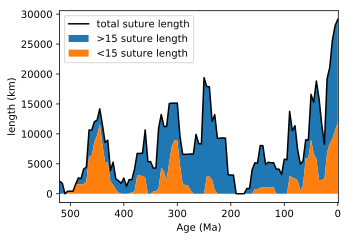

In [34]:
plt.figure(figsize=(5,12))
ax1 = plt.subplot(3,1,1)

#plot within_20 + greater_20
ax1.plot(time_list_5Myr,output_df['greater_20_suture']+output_df['within_20_suture'],color='k',label='total suture length')
#plot fill between total suture and within_20 suture length
ax1.fill_between(time_list_5Myr,output_df['within_15_suture'],output_df['total_suture'],label='>15 suture length')
#plot fill between within_20 suture length and 0
ax1.fill_between(time_list_5Myr,output_df['within_15_suture'],0,label='<15 suture length')
plt.xlim(520, -1)
plt.ylabel('length (km)')
plt.xlabel('Age (Ma)')
plt.legend()
plt.show()

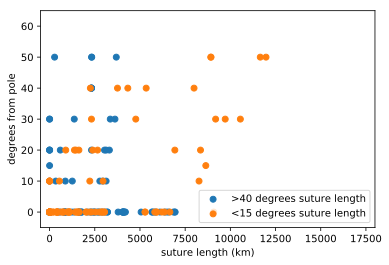

In [35]:
plt.scatter(output_df['greater_40_suture'],output_df['ice_extent'],label='>40 degrees suture length')
plt.scatter(output_df['within_15_suture'],output_df['ice_extent'],label='<15 degrees suture length')
plt.xlabel('suture length (km)')
plt.ylabel('degrees from pole')
plt.xlim(-500,18000)
plt.ylim(-5,65)
plt.legend(loc='lower right')
plt.show()

## Correlation calculations

In [36]:
from scipy.stats.stats import pearsonr  
print('pearsonr between <15 sutures length and ice extent')
print(pearsonr(output_df['within_15_suture'],ice_extent_5Myr))
print('')
print('pearsonr between >15 sutures length and ice extent')
print(pearsonr(output_df['greater_15_suture'],ice_extent_5Myr))
print('')
print('pearsonr between <20 sutures length and ice extent')
print(pearsonr(output_df['within_20_suture'],ice_extent_5Myr))
print('')
print('pearsonr between >20 sutures length and ice extent')
print(pearsonr(output_df['greater_20_suture'],ice_extent_5Myr))
print('')
print('pearsonr between >40 sutures length and ice extent')
print(pearsonr(output_df['greater_40_suture'],ice_extent_5Myr))
print('')
print('pearsonr between total sutures length and ice extent')
print(pearsonr(output_df['total_suture'],ice_extent_5Myr))
print('')
print('pearsonr between total LIP area (decay) and ice extent')
print(pearsonr(output_df['total_LIP_decay'],ice_extent_5Myr))
print('')
print('pearsonr between <15 LIP area (decay) and ice extent')
print(pearsonr(output_df['within_15_LIP_decay'],ice_extent_5Myr))
print('')
print('pearsonr between total LIP area (burial + decay) and ice extent')
print(pearsonr(output_df['total_LIP_decay_burial'],ice_extent_5Myr))
print('')
print('pearsonr between <15 LIP area (burial + decay) and ice extent')
print(pearsonr(output_df['within_15_LIP_decay_burial'],ice_extent_5Myr))
print('')
print('pearsonr between continental arc length and ice extent')
print(pearsonr(continental_arc_length_5Myr,ice_extent_5Myr))

pearsonr between <15 sutures length and ice extent
(0.6445520123446944, 1.1775742995836687e-13)

pearsonr between >15 sutures length and ice extent
(0.3487269329423477, 0.00026660718237575136)

pearsonr between <20 sutures length and ice extent
(0.6588986580037555, 2.160884787251515e-14)

pearsonr between >20 sutures length and ice extent
(0.28766113163762946, 0.0029248642259148984)

pearsonr between >40 sutures length and ice extent
(-0.05858554520305266, 0.552748050492428)

pearsonr between total sutures length and ice extent
(0.5725073203988301, 1.7616714573570185e-10)

pearsonr between total LIP area (decay) and ice extent
(-0.13104171108073398, 0.18270976510141565)

pearsonr between <15 LIP area (decay) and ice extent
(-0.13076166065438705, 0.18365486071952317)

pearsonr between total LIP area (burial + decay) and ice extent
(0.004315640373798637, 0.9651491252958581)

pearsonr between <15 LIP area (burial + decay) and ice extent
(0.1035024535631429, 0.29339002953414317)

pearsonr 

## Generate bar plots of latitudinal distribution in 35 Myr intervals

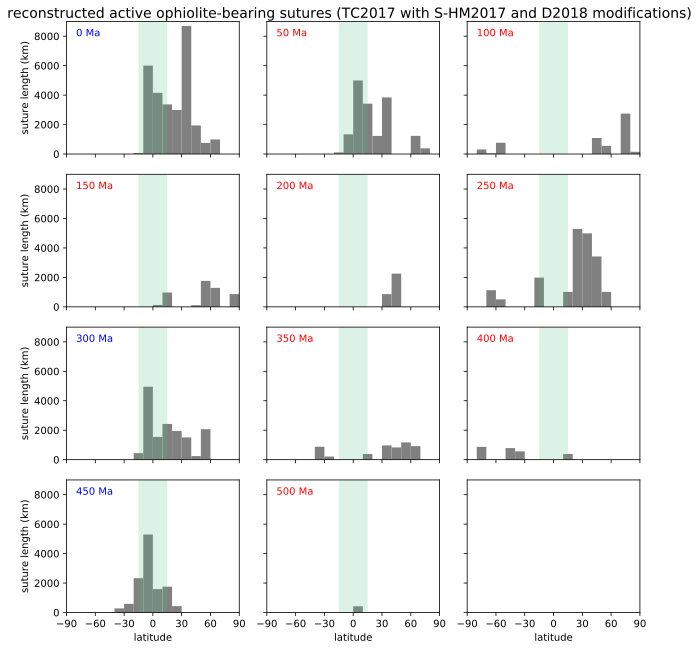

In [37]:
fig, axes = plt.subplots(4,3, sharex=True, sharey=True,figsize=(9,9))
plt.xlim(-90,90)
plt.xticks(np.arange(-90, 120, step=30))

for i, ax in enumerate(axes.flatten()):
    if i< 11:
        ax.bar(lat_mids, active_lengths_array_TC17_SHM17_D18_10degree[i*10],width=10,color='grey',align='center')
        tropics = patches.Rectangle((-15,0),30,9000,edgecolor='none',alpha=0.2,facecolor='#52BE80')
        ax.add_patch(tropics)
        plt.ylim(0,9000)
        if float(time_list_5Myr[i*10]) < 35:
            ax.text(-80,8000,str(time_list_5Myr[i*10])+' Ma', color='blue')
        elif float(time_list_5Myr[i*10]) < 276:
            ax.text(-80,8000,str(time_list_5Myr[i*10])+' Ma', color='red')
        elif float(time_list_5Myr[i*10]) < 337:
            ax.text(-80,8000,str(time_list_5Myr[i*10])+' Ma', color='blue')
        elif float(time_list_5Myr[i*10]) < 440:
            ax.text(-80,8000,str(time_list_5Myr[i*10])+' Ma', color='red')
        elif float(time_list_5Myr[i*10]) < 456:
            ax.text(-80,8000,str(time_list_5Myr[i*10])+' Ma', color='blue')
        elif float(time_list_5Myr[i*10]) < 540:
            ax.text(-80,8000,str(time_list_5Myr[i*10])+' Ma', color='red')
axes.flatten()[0].set_ylabel('suture length (km)')
axes.flatten()[3].set_ylabel('suture length (km)')
axes.flatten()[6].set_ylabel('suture length (km)')
axes.flatten()[9].set_ylabel('suture length (km)')
#axes.flatten()[12].set_ylabel('suture length (km)')
axes.flatten()[-3].set_xlabel('latitude')
axes.flatten()[-2].set_xlabel('latitude')
axes.flatten()[-1].set_xlabel('latitude')
title = fig.suptitle("reconstructed active ophiolite-bearing sutures (TC2017 with S-HM2017 and D2018 modifications)", fontsize=14, horizontalalignment='center')
title.set_y(1)
title.set_x(0.525)
plt.tight_layout()
plt.savefig('code_output/active_suture_bar_plot.pdf')
plt.show()

## Build up a GIF of reconstructions over the past 500 million years

This code creates snapshots of reconstructions in 5 million year steps over the past 500 million years. These images are combined in the suture_GIF_creation.ipynb notebook to make animations.

In [38]:
anchor = 1  #anchor plate ID (1 : spin axis)
recon_image_list = []

for t in range(0,525,5):

    CEED_blocks_recon = []
    pygplates.reconstruct(CEED_blocks, TC17_SHM17_D18_model, CEED_blocks_recon, t, anchor)

    sutures_active_recon = []
    pygplates.reconstruct(sutures_CEED_max_min, TC17_SHM17_D18_model, sutures_active_recon, t, anchor)
    
    fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
    ax.set_global()
    ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')
    ax.add_patch(patches.Rectangle(xy=[-180, -15], width=360, height=30,
                                    facecolor='#52BE80',
                                    alpha=0.2,
                                    transform=ccrs.PlateCarree()))

    plot_reconstructed_feature(ax,CEED_blocks_recon)
    plot_reconstructed_feature(ax,sutures_active_recon,color='orange',linewidth=2.5)
    plt.title(str(t) + ' Ma reconstruction\n (active ophiolite-bearing sutures are orange)')
    image_name = 'code_output/paleogeo_snapshots/recon' + str(t) + '.png'
    recon_image_list.append(image_name)
    plt.savefig(image_name)
    plt.close()

## Build up a GIF of reconstructions over the past 520 million years with schematic ice extent

What is shown in these images is a schematic extent of ice that extends as far as the maximum extent in the compilation. These images are not a representation of ice sheets through time and are developed to be broadly illustrative. 

In [39]:
output_df_ageindex = output_df.set_index('age_Ma')

In [40]:
for t in range(0,525,5):
    
    CEED_blocks_recon = []
    pygplates.reconstruct(CEED_blocks, TC17_SHM17_D18_model, CEED_blocks_recon, t, anchor)

    sutures_active_recon = []
    pygplates.reconstruct(sutures_CEED_max_min, TC17_SHM17_D18_model, sutures_active_recon, t, anchor)

    fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(projection=ccrs.Robinson()))
    ax.set_global()
    ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')
    ax.add_patch(patches.Rectangle(xy=[-180, -15], width=360, height=30,
                                    facecolor='#52BE80',
                                    alpha=0.2,
                                    transform=ccrs.PlateCarree()))
    if t<10:
        ax.add_patch(patches.Rectangle(xy=[-180, 90-output_df_ageindex.ice_extent[t]], width=360, height=output_df_ageindex.ice_extent[t],
                                        facecolor='#37A4DA',
                                        alpha=0.4,
                                        transform=ccrs.PlateCarree()))
        ax.add_patch(patches.Rectangle(xy=[-180, -90], width=360, height=output_df_ageindex.ice_extent[t],
                                facecolor='#37A4DA',
                                alpha=0.4,
                                transform=ccrs.PlateCarree()))
    if t>=10:
        ax.add_patch(patches.Rectangle(xy=[-180, -90], width=360, height=output_df_ageindex.ice_extent[t],
                                facecolor='#37A4DA',
                                alpha=0.4,
                                transform=ccrs.PlateCarree()))
    

    plot_reconstructed_feature(ax,CEED_blocks_recon)
    plot_reconstructed_feature(ax,sutures_active_recon,color='orange',linewidth=2.5)
    plt.title(str(t) + ' Ma reconstruction\n (active ophiolite-bearing sutures are orange)\n (schematic maximum ice extent in blue)')
    image_name = 'code_output/paleogeo_snapshots/recon_ice' + str(t) + '.png'
    recon_image_list.append(image_name)
    plt.savefig(image_name)
    plt.close()

## Code for recon_tools.py functions

For the sake of documentation, the functions imported at the start of the notebook from the recon_tools.py functions that were developed for these analyses are shown below.

In [41]:
import math
from numpy.core.umath_tests import inner1d
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import numpy as np
from shapely.geometry.polygon import Polygon
import pygplates
import pandas as pd


########## BASIC CALCULATIONS ##########


def lat_lon_2_cart(lat, lon):
    """
    Convert lat/lon coordinates to cartesian.

    Parameters
    ----------
    lat : array-like
        latitude (-90 to 90)
    lon : array-like
        longitude (-180 to 180)

    Returns
    -------
    cart : tuple
        (x, y, z) cartesian coordinates on the unit sphere
    """
    # convert to radians
    lat = math.radians(lat)
    lon = math.radians(lon)
    # calculations
    x = math.cos(lon) * math.cos(lat)
    y = math.sin(lon) * math.cos(lat)
    z = math.sin(lat)
    cart = (x, y, z)

    return cart


def cart_2_lat_lon(cart):
    """
    Convert cartesian coordinates to lat/lon.

    Parameters
    ----------
    cart : tuple
        (x, y, z) cartesian coordinates on the unit sphere

    Returns
    -------
    lat : array-like
        latitude (-90 to 90)
    lon : array-like
        longitude (-180 to 180)
    """
    # calculations
    lon = math.atan2(cart[1], cart[0])
    lat = math.atan2(cart[2], math.sqrt(cart[0]**2 + cart[1]**2))
    # convert to degrees
    lat = math.degrees(lat)
    lon = math.degrees(lon)

    return lat, lon


def fast_cross(a, b):
    """
    3D matrix cross multiplication.
    source: http://ssb.stsci.edu/doc/stsci_python_x/stsci.sphere.doc/html/_modules/stsci/sphere/great_circle_arc.html

    Parameters
    ----------
    a, b : numpy arrays
        matrices to be cross multiplied

    Returns
    -------
    cp : numpy array
        cross product
    """
    cp = np.empty(np.broadcast(a, b).shape)
    aT = a.T
    bT = b.T
    cpT = cp.T
    cpT[0] = aT[1]*bT[2] - aT[2]*bT[1]
    cpT[1] = aT[2]*bT[0] - aT[0]*bT[2]
    cpT[2] = aT[0]*bT[1] - aT[1]*bT[0]

    return cp


def cross_and_normalize(A, B):
    """
    3D matrix cross multiplication and normalized.
    source: http://ssb.stsci.edu/doc/stsci_python_x/stsci.sphere.doc/html/_modules/stsci/sphere/great_circle_arc.html

    Parameters
    ----------
    A, B : numpy arrays
        matrices to be cross multiplied

    Returns
    -------
    TN : numpy array
        normalized cross product
    """
    T = fast_cross(A, B)
    # normalization
    l = np.sqrt(np.sum(T ** 2, axis=-1))
    l = np.expand_dims(l, 2)
    # might get some divide-by-zeros, but we don't care
    with np.errstate(invalid='ignore'):
        TN = T / l

    return TN


def intersection(A, B, C, D):
    """
    Point of intersection between two great circle arcs.
    source: http://ssb.stsci.edu/doc/stsci_python_x/stsci.sphere.doc/html/_modules/stsci/sphere/great_circle_arc.html

    Parameters
    ----------
    A, B : (*x*, *y*, *z*) triples or Nx3 arrays of triples
        Endpoints of the first great circle arc.
    C, D : (*x*, *y*, *z*) triples or Nx3 arrays of triples
        Endpoints of the second great circle arc.

    Returns
    -------
    T : (*x*, *y*, *z*) triples or Nx3 arrays of triples
        If the given arcs intersect, the intersection is returned. If the arcs do not intersect,
        the triple is set to all NaNs.
    """
    A = np.asanyarray(A)
    B = np.asanyarray(B)
    C = np.asanyarray(C)
    D = np.asanyarray(D)

    A, B = np.broadcast_arrays(A, B)
    C, D = np.broadcast_arrays(C, D)

    ABX = fast_cross(A, B)
    CDX = fast_cross(C, D)
    T = cross_and_normalize(ABX, CDX)
    T_ndim = len(T.shape)

    if T_ndim > 1:
        s = np.zeros(T.shape[0])
    else:
        s = np.zeros(1)
    s += np.sign(inner1d(fast_cross(ABX, A), T))
    s += np.sign(inner1d(fast_cross(B, ABX), T))
    s += np.sign(inner1d(fast_cross(CDX, C), T))
    s += np.sign(inner1d(fast_cross(D, CDX), T))
    if T_ndim > 1:
        s = np.expand_dims(s, 2)

    cross = np.where(s == -4, -T, np.where(s == 4, T, np.nan))

    # If they share a common point, it's not an intersection.  This
    # gets around some rounding-error/numerical problems with the
    # above.
    equals = (np.all(A == C, axis=-1) |
              np.all(A == D, axis=-1) |
              np.all(B == C, axis=-1) |
              np.all(B == D, axis=-1))

    equals = np.expand_dims(equals, 2)

    T = np.where(equals, np.nan, cross)

    return T


########## ZONAL CALCULATIONS ##########


def check_polygon_in_band(polygon, lat_min, lat_max):
    """
    Check to see whether any part of a given polygon is inside a given latitude band.

    Parameters
    ----------
    polygon : pygpplates polygon
    lat_min : float
        the minimum latitude of the latitude band
    lat_max : float
        the maximum latitude of the latitude band

    Returns
    -------
    in_band : boolean
        True if inside, False if outside
    """
    # pull out lat/lon vertices
    lat_lon_array = polygon.to_lat_lon_array()
    lats = lat_lon_array[:,0]

    # check to see if any part of the polygon falls into our latitude band
    in_band = False
    for j in range(len(lats)):
        if lats[j]>lat_min and lats[j]<lat_max:
            in_band = True
            break

    return in_band


def get_area_in_band(polygon, lat_min, lat_max):
    """
    Calculate the area of a given polygon inside a given latitude band.

    Parameters
    ----------
    polygon : pygpplates polygon
    lat_min : float
        the minimum latitude of the latitude band
    lat_max : float
        the maximum latitude of the latitude band

    Returns
    -------
    area : float
        the area of the polygon within the latitude band (in km^2)
    band_polygon : pygplates polygon
        with the parts outside of the latitude band removed
    """
    # pull out lat/lon vertices
    lat_lon_array = polygon.to_lat_lon_array()
    lats = lat_lon_array[:,0]
    lons = lat_lon_array[:,1]

    # storage lists
    bookmarks = []
    lat_add_list = []
    lon_add_list = []

    # iterate through the points
    for i in range(1,len(lats)):
        top_cross = False
        bot_cross = False

        # case where we move into the band from above
        if lats[i-1]>lat_max and lats[i]<lat_max:
            top_cross = True
        # case where we move out of the band from below
        if lats[i-1]<lat_max and lats[i]>lat_max:
            top_cross = True
        # case where we move out of the band from above
        if lats[i-1]>lat_min and lats[i]<lat_min:
            bot_cross = True
        # case where we move into the band from below
        if lats[i-1]<lat_min and lats[i]>lat_min:
            bot_cross = True

        # do calculations if we cross
        if top_cross or bot_cross:

            # convert the endpoints of the polygon segment into cartesian
            A = lat_lon_2_cart(lats[i-1], lons[i-1])
            B = lat_lon_2_cart(lats[i]  , lons[i])

            # get the intersection point (for the top and bottom cases), and convert back to lat/lon
            if top_cross:
                C_top = lat_lon_2_cart(lat_max, min([lons[i],lons[i-1]]))
                D_top = lat_lon_2_cart(lat_max, max([lons[i],lons[i-1]]))
                T = intersection(A, B, C_top, D_top)
            else:
                C_bot = lat_lon_2_cart(lat_min, min([lons[i],lons[i-1]]))
                D_bot = lat_lon_2_cart(lat_min, max([lons[i],lons[i-1]]))
                T = intersection(A, B, C_bot, D_bot)
            lat_add, lon_add = cart_2_lat_lon(T)

            # add to the storage lists
            bookmarks.append(i)
            lat_add_list.append(lat_add)
            lon_add_list.append(lon_add)

    # now insert the stored values into the original arrays
    new_lats = np.insert(lats, bookmarks, lat_add_list)
    new_lons = np.insert(lons, bookmarks, lon_add_list)

    # only keep values below the maximum latitude (with small buffer)
    mask = np.less(new_lats, lat_max+0.1)
    new_lats = new_lats[mask]
    new_lons = new_lons[mask]

    # only keep values above the minimum latitude
    mask = np.greater(new_lats, lat_min-0.1)
    new_lats = new_lats[mask]
    new_lons = new_lons[mask]

    # create a Polygon, if we are left with enough points
    if len(new_lats) >= 3:
        band_polygon = pygplates.PolygonOnSphere(zip(new_lats,new_lons))

        # get the area in km2
        area = band_polygon.get_area() * 6371.009**2

    # if we don't...
    else:
        area = 0
        band_polygon = None

    return area, band_polygon


def get_areas_in_bands(reconstructed_feature_geometries, lat_mins, lat_maxs):
    """
    Get the area of all features in each latitude band.

    Parameters
    ----------
    reconstructed_feature_geometries : list
        list of reconstructed features
    lat_mins : array-like
        array-like of latitude minimums
    lat_maxs : array_like
        array_like of latitude maximums

    Returns
    -------
    areas : array
        list of total area in each latitude band
    area_polygons : list
        list of all polygons for which areas were calculated
    """
    # storage vectors
    areas = np.array([])
    area_polygons = []

    # iterate over each latitude band
    for i in range(len(lat_mins)):

        accumulated_area = 0

        # iterate over each polygon
        for j in range(len(reconstructed_feature_geometries)):

            current_polygon = reconstructed_feature_geometries[j].get_reconstructed_geometry()

            # check if the polygon is in the band
            in_band = check_polygon_in_band(current_polygon, lat_mins[i], lat_maxs[i])

            if in_band:
                # do the calculation
                area, band_polygon = get_area_in_band(current_polygon, lat_mins[i], lat_maxs[i])

                # store results
                accumulated_area = accumulated_area + area
                area_polygons.append(band_polygon)

        # store total area for the band
        areas = np.append(areas, accumulated_area)

    return areas, area_polygons


def get_length_in_band(polyline, lat_min, lat_max):
    """
    Calculate the length of a given polyline inside a given latitude band.

    Parameters
    ----------
    polyline : pygpplates polyline
    lat_min : float
        the minimum latitude of the latitude band
    lat_max : float
        the maximum latitude of the latitude band

    Returns
    -------
    length : float
        the length of the polyline within the latitude band (in km)
    band_polylines : list
        pygplates polylines with the parts outside of the latitude band removed
    """
    # pull out lat/lon vertices
    lat_lon_array = polyline.to_lat_lon_array()
    lats = lat_lon_array[:,0]
    lons = lat_lon_array[:,1]

    # storage lists
    bookmarks = []
    lat_add_list = []
    lon_add_list = []

    # iterate through the points
    for i in range(1,len(lats)):
        top_cross = False
        bot_cross = False

        # case where we move into the band from above
        if lats[i-1]>lat_max and lats[i]<lat_max:
            top_cross = True
        # case where we move out of the band from below
        if lats[i-1]<lat_max and lats[i]>lat_max:
            top_cross = True
        # case where we move out of the band from above
        if lats[i-1]>lat_min and lats[i]<lat_min:
            bot_cross = True
        # case where we move into the band from below
        if lats[i-1]<lat_min and lats[i]>lat_min:
            bot_cross = True

        # do calculations if we cross
        if top_cross or bot_cross:

            # convert the endpoints of the polygon segment into cartesian
            A = lat_lon_2_cart(lats[i-1], lons[i-1])
            B = lat_lon_2_cart(lats[i]  , lons[i])

            # get the intersection point (for the top and bottom cases), and convert back to lat/lon
            if top_cross:
                C_top = lat_lon_2_cart(lat_max, min([lons[i],lons[i-1]]))
                D_top = lat_lon_2_cart(lat_max, max([lons[i],lons[i-1]]))
                T = intersection(A, B, C_top, D_top)
            else:
                C_bot = lat_lon_2_cart(lat_min, min([lons[i],lons[i-1]]))
                D_bot = lat_lon_2_cart(lat_min, max([lons[i],lons[i-1]]))
                T = intersection(A, B, C_bot, D_bot)
            lat_add, lon_add = cart_2_lat_lon(T)

            # add to the storage lists
            bookmarks.append(i)
            lat_add_list.append(lat_add)
            lon_add_list.append(lon_add)

    # now insert the stored values into the original arrays
    new_lats = np.insert(lats, bookmarks, lat_add_list)
    new_lons = np.insert(lons, bookmarks, lon_add_list)

    # mask points above and below the latitude band (with small buffer)
    top_mask = np.less(new_lats, lat_max+0.1)
    bot_mask = np.greater(new_lats, lat_min-0.1)
    mask = top_mask & bot_mask

    # initiate final output variabiles
    length = 0
    band_polylines = []

    # initiate lat lon arrays for the current polyline that is being split out
    split_lats = np.array([])
    split_lons = np.array([])
    hold = False

    # iterate through the mask
    for i in range(len(mask)):
        if mask[i]:
            # begin holding, and store points
            hold = True
            split_lats = np.append(split_lats, new_lats[i])
            split_lons = np.append(split_lons, new_lons[i])

        # i.e. the first time we reach a point outside of the band
        elif hold:
            # create a polyline, if we are left with enough points
            if len(split_lats) >= 2:
                band_polyline = pygplates.PolylineOnSphere(zip(split_lats,split_lons))

                # get the length in km
                length_split = band_polyline.get_arc_length() * pygplates.Earth.mean_radius_in_kms

                # store
                length = length + length_split
                band_polylines.append(band_polyline)

            # reset stuff
            split_lats = np.array([])
            split_lons = np.array([])
            hold = False

    # if the last point was within the band
    if hold:
        # create a polyline, if we are left with enough points
        if len(split_lats) >= 2:
            band_polyline = pygplates.PolylineOnSphere(zip(split_lats,split_lons))

            # get the length in km
            length_split = band_polyline.get_arc_length() * pygplates.Earth.mean_radius_in_kms

            # store
            length = length + length_split
            band_polylines.append(band_polyline)

    return length, band_polylines


def get_lengths_in_bands(reconstructed_feature_geometries, lat_mins, lat_maxs):
    """
    Get the area of all features in each latitude band.

    Parameters
    ----------
    reconstructed_feature_geometries : list
        list of reconstructed features
    lat_mins : array-like
        array-like of latitude minimums
    lat_maxs : array_like
        array_like of latitude maximums

    Returns
    -------
    accumulated_lengths : array
        array of total area in each latitude band
    length_polylines : polylines
        list of all polylines for which areas were calculated
    polyline_attributes : Pandas Dataframe
        Dataframe with names, lengths, latitudes and recon_times for each polyline
    """
    # storage vectors
    lengths = np.array([])
    accumulated_lengths = np.array([])
    length_polylines = []
    names = []
    polyline_lat_min = []
    polyline_lat_max = []
    recon_times = []

    # iterate over each latitude band
    for i in range(len(lat_mins)):

        accumulated_length = 0

        # iterate over each polygon
        for j in range(len(reconstructed_feature_geometries)):

            current_polyline = reconstructed_feature_geometries[j].get_reconstructed_geometry()


            # check if the polygon is in the band
            in_band = check_polygon_in_band(current_polyline, lat_mins[i], lat_maxs[i])

            if in_band:
                # do the calculation
                length, band_polyline = get_length_in_band(current_polyline, lat_mins[i], lat_maxs[i])
                name = reconstructed_feature_geometries[j].get_feature().get_name()
                recon_time = reconstructed_feature_geometries[j].get_reconstruction_time()

                # store results
                accumulated_length = accumulated_length + length
                length_polylines.append(band_polyline)
                names.append(name)
                lengths = np.append(lengths, length)
                polyline_lat_min.append(lat_mins[i])
                polyline_lat_max.append(lat_maxs[i])
                recon_times.append(recon_time)

        # store total area for the band
        accumulated_lengths = np.append(accumulated_lengths, accumulated_length)

        polyline_attributes = pd.DataFrame({'name':names,'length':lengths,'polyline_lat_min':polyline_lat_min,'polyline_lat_max':polyline_lat_max,'recon_time':recon_times})

    return accumulated_lengths, length_polylines, polyline_attributes

########## PLOTTING FUNCTIONS ##########

def plot_feature(ax,feature,color='grey',linewidth=1):
    for n in range(len(feature)):

        # pull out lat/lon vertices
        lat_lon_array = feature[n].to_lat_lon_array()
        lats = lat_lon_array[:,0]
        lons = lat_lon_array[:,1]

        ax.plot(lons,lats, transform=ccrs.Geodetic(), color=color, linewidth=linewidth)


def plot_reconstructed_feature(ax,reconstructed_feature,color='grey',linewidth=1):
    for n in range(len(reconstructed_feature)):

        # pull out lat/lon vertices
        lat_lon_array = reconstructed_feature[n].get_reconstructed_geometry().to_lat_lon_array()
        lats = lat_lon_array[:,0]
        lons = lat_lon_array[:,1]

        ax.plot(lons,lats, transform=ccrs.Geodetic(), color=color, linewidth=linewidth)


def plot_reconstruction(reconstructed_feature_geometries_list, color_list, lon_0):
    """
    Plot a global reconstruction from pygplates.

    Parameters
    ----------
    reconstructed_feature_geometries_list : list of lists
        list of lists of reconstructed features
    color_list : list of colors
        list of matplotlib color for geometries
    lon_0 : float
        the central longitude for viewing

    Returns
    -------
    None.
    """
    # initialize map
    fig = plt.figure(figsize=(12,10))

    ax = plt.subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=lon_0))

    ax.set_title(str(reconstructed_feature_geometries_list[0][0].get_reconstruction_time()) + ' Ma')
    ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')

    # loop over each reconstructed geometry list
    for i in range(len(reconstructed_feature_geometries_list)):

        # loop over each reconstructed geometry
        for j in range(len(reconstructed_feature_geometries_list[i])):

            # pull out lat/lon vertices
            lat_lon_array = reconstructed_feature_geometries_list[i][j].get_reconstructed_geometry().to_lat_lon_array()
            lats = lat_lon_array[:,0]
            lons = lat_lon_array[:,1]

            # zip the result
            poly = Polygon(zip(lons, lats))

            # add the polygon to the map
            ax.add_geometries([poly], ccrs.PlateCarree(), facecolor=color_list[i], edgecolor='k', alpha=0.5)
            #ax.plot(lons,lats,transform=ccrs.Geodetic(),color=color_list[i],linewidth=1)

    plt.show()


def plot_polygons(polygon_list, color, lon_0):
    """
    Plot pygplates polygons.

    Parameters
    ----------
    polygon_list : list
        list of pygplates polygons
    color : color
        matplotlib color for geometries
    lon_0 : float
        the central longitude for viewing

    Returns
    -------
    None.
    """
    # initialize map
    fig = plt.figure(figsize=(12,10))

    ax = plt.subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=lon_0))
    ax.gridlines(xlocs=np.arange(-180,181,60),ylocs=np.arange(-90,91,30),linestyle='--')

    # loop over each polygon
    for i in range(len(polygon_list)):

        if polygon_list[i] != None:
            # pull out lat/lon vertices
            lat_lon_array = polygon_list[i].to_lat_lon_array()
            lats = lat_lon_array[:,0]
            lons = lat_lon_array[:,1]

            # zip the result
            poly = Polygon(zip(lons, lats))

            # add the polygon to the map
            ax.add_geometries([poly], ccrs.PlateCarree(), facecolor=color, edgecolor='k', alpha=0.5)
            #ax.plot(lons,lats,transform=ccrs.Geodetic(),color=color,linewidth=1)

    plt.show()
